In [1]:
using Distributions
using Random
using StatsBase: ecdf
using StatsPlots
default(fmt=:png, titlefontsize=10, tickfontsize=6)

ECDF(A, x) = count(≤(x), A)/length(A)
safediv(x, y) = x == 0 ? zero(x/y) : x/y
x ⪅ y = x < y || x ≈ y

⪅ (generic function with 1 method)

In [2]:
function plot_ecdfpval(pvals;
        n = length(pvals), 
        labels = fill("", n),
        linestyles = fill(:auto, n),
        size = (400, 400),
        legend = :bottomright,
        kwargs...
    )
    _tick = Any[0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1]
    xtick = ytick = (float.(_tick), string.(_tick))
    xlim = ylim = (0.0015, 1.1)
    αs = exp.(range(log(0.002), log(1), 1000))
    P = plot()
    for (pval, label, ls) in zip(pvals, labels, linestyles)
        _ecdf_pval = ecdf(pval)
        plot!(αs, α -> _ecdf_pval(α); label, ls, kwargs...)
    end
    plot!(αs, x->x; label="", ls=:dot, alpha=0.5, c=:black)
    plot!(αs, x->0.8x; label="", ls=:dot, alpha=0.3, c=:black)
    plot!(αs, x->1.2x; label="", ls=:dot, alpha=0.3, c=:black)
    plot!(; xscale=:log10, yscale=:log10, xtick, ytick, xlim, ylim)
    plot!(; xguide="α", yguide="probability of P-value ≤ α")
    plot!(; size, legend)
end

plot_ecdfpval (generic function with 1 method)

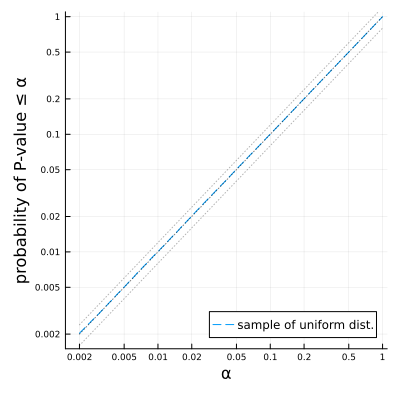

In [3]:
pval = rand(10^6)
plot_ecdfpval([pval]; labels=["sample of uniform dist."])

In [4]:
_pdf_le(x, (dist, y)) =  pdf(dist, x) ⪅ y

function _search_boundary(f, x0, Δx, param)
    x = x0
    if f(x, param)
        while f(x - Δx, param) x -= Δx end
    else
        x += Δx
        while !f(x, param) x += Δx end
    end
    x
end

function pvalue_minlike(dist::DiscreteUnivariateDistribution, x)
    Px = pdf(dist, x)
    Px == 0 && return Px
    Px == 1 && return Px
    m = mode(dist)
    Px ≈ pdf(dist, m) && return one(Px)
    if x < m
        y = _search_boundary(_pdf_le, 2m - x, 1, (dist, Px))
        cdf(dist, x) + ccdf(dist, y-1)
    else # x > m
        y = _search_boundary(_pdf_le, 2m - x, -1, (dist, Px))
        cdf(dist, y) + ccdf(dist, x-1)
    end
end

function pvalue_score_bin(k, n, p)
    p̂ = k/n
    sehat = √(p*(1-p)/n)
    z = safediv(p̂ - p, sehat)
    2ccdf(Normal(), abs(z))
end

function pvalue_wald_bin(k, n, p)
    p̂ = k/n
    sehat = √(p̂*(1-p̂)/n)
    z = safediv(p̂ - p, sehat)
    2ccdf(Normal(), abs(z))
end

pvalue_minlike_bin(k, n, p) = pvalue_minlike(Binomial(n, p), k)

function pvalue_central_bin(k, n, p)
    bin = Binomial(n, p)
    min(1, 2cdf(bin, k), 2ccdf(bin, k-1))
end

pvalue_central_bin (generic function with 1 method)

In [25]:
function plot_bin(; n = 50, p = 0.2, L = 10^6)
    @show bin = Binomial(n, p)
    K = rand(bin, L)
    pval_score = pvalue_score_bin.(K, n, p)
    pval_wald = pvalue_wald_bin.(K, n, p)
    pval_minlike = pvalue_minlike_bin.(K, n, p)
    pval_central = pvalue_central_bin.(K, n, p)

    X = [
        (pval_score, "score test", 1),
        (pval_wald, "Wald test", 2),
        (pval_minlike, "exact test (minlike)", 3),
        (pval_central, "exact test (central)", 4),
    ]
    PP = []
    for (pval, name, c) in X
        P = plot_ecdfpval([pval]; linestyles=[:solid], c)
        title!("binomial $name")
        push!(PP, P)
    end

    plot(PP...; size=(800, 800), layout=(2, 2))
end

plot_bin (generic function with 1 method)

bin = Binomial(n, p) = Binomial{Float64}(n=20, p=0.2)


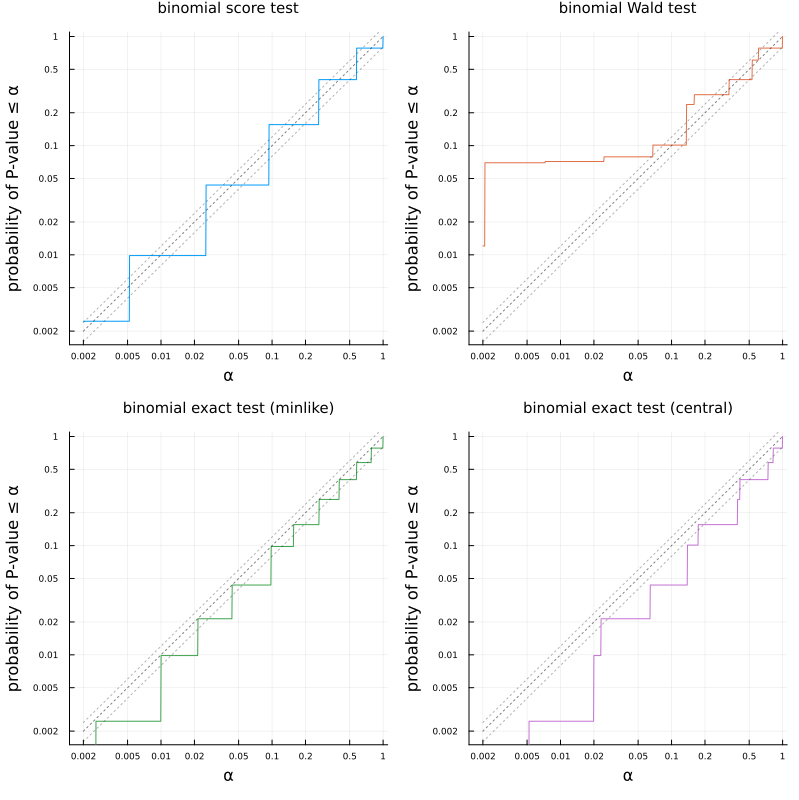

In [26]:
plot_bin(n = 20, p = 0.2)

bin = Binomial(n, p) = Binomial{Float64}(n=80, p=0.05)


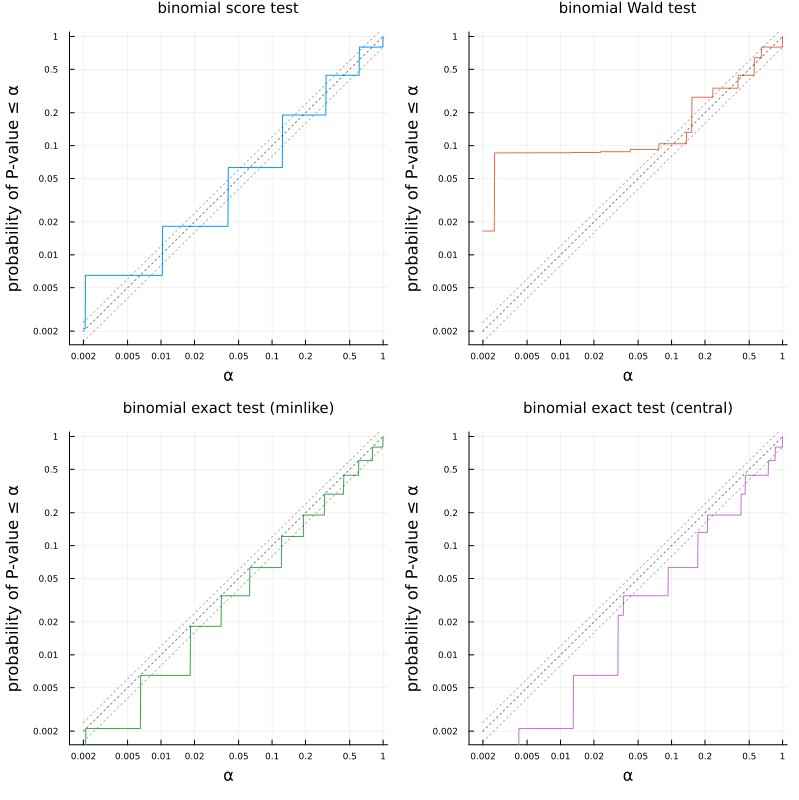

In [27]:
plot_bin(n = 80, p = 0.05)

In [8]:
randpoissons(E) = @. rand(Poisson(E))

function randmultinomial((N, P))
    A = rand(Multinomial(N, vec(P)))
    reshape(A, size(P))
end

function randmultinomials((Ns, Ps))
    r = length(Ns)
    A = similar(Ps, Int)
    for i in 1:r
        rand!(Multinomial(Ns[i], @view(Ps[i,:])), @view(A[i,:]))
    end
    A
end

randmultinomials (generic function with 1 method)

In [9]:
expectval(A) = sum(A; dims=2) * sum(A; dims=1) / sum(A)

function pvalue_pearson_chisq_2x2(A)
    @assert size(A) == (2, 2)
    a, b, c, d = A'
    chi2 = (a+b+c+d)*safediv((a*d - b*c)^2, (a+b)*(c+d)*(a+c)*(b+d))
    ccdf(Chisq(1), chi2)
end

function pvalue_yates_chisq_2x2(A)
    @assert size(A) == (2, 2)
    a, b, c, d = A'
    N = a+b+c+d
    chi2 = N*safediv(max(0, abs(a*d - b*c) - N/2)^2, (a+b)*(c+d)*(a+c)*(b+d))
    ccdf(Chisq(1), chi2)
end

function pvalue_fisher_central_2x2(A)
    @assert size(A) == (2, 2)
    a, b, c, d = A'
    hg = Hypergeometric(a+b, c+d, a+c)
    min(1, 2cdf(hg, a), 2ccdf(hg, a-1))
end

function pvalue_fisher_minlike_2x2_slow(A)
    @assert size(A) == (2, 2)
    a, b, c, d = A'
    hg = Hypergeometric(a+b, c+d, a+c)
    pa = pdf(hg, a)
    sum(pdf(hg, x) for x in support(hg) if pdf(hg, x) ⪅ pa)
end

function pvalue_fisher_minlike_2x2(A)
    @assert size(A) == (2, 2)
    a, b, c, d = A'
    hg = Hypergeometric(a+b, c+d, a+c)
    pvalue_minlike(hg, a)
end

function sim_2x2(randfunc, param; L=10^6)
    pval_fisher_central = zeros(L)
    pval_fisher_minlike = zeros(L)
    pval_pearson_chisq = zeros(L)
    pval_yates_chisq = zeros(L)
    Threads.@threads for i in 1:L
        A = randfunc(param)
        pval_fisher_central[i] = pvalue_fisher_central_2x2(A)
        pval_fisher_minlike[i] = pvalue_fisher_minlike_2x2(A)
        pval_pearson_chisq[i] = pvalue_pearson_chisq_2x2(A)
        pval_yates_chisq[i] = pvalue_yates_chisq_2x2(A)
    end
    pval_fisher_central, pval_fisher_minlike, pval_pearson_chisq, pval_yates_chisq
end

function plot_2x2(A; L=10^6)
    println("A =")
    show(stdout, MIME("text/plain"), A)
    println()
    println()
    
    @show pvalue_pearson_chisq_2x2(A)
    @show pvalue_yates_chisq_2x2(A)
    @show pvalue_fisher_central_2x2(A)
    @show pvalue_fisher_minlike_2x2(A)
    println()

    E = expectval(A)
    println("E = expectval(A) =")
    show(stdout, MIME("text/plain"), E)
    println()
    println()
    @show N = sum(A)
    @show Ns = sum(A; dims=2)
    println()
    
    randfuncs = (
        randpoissons, randpoissons,
        randmultinomial, randmultinomial,
        randmultinomials, randmultinomials,
    )
    params = (
        E, A,
        (N, E / N), (N, A / N),
        (Ns, E ./ Ns), (Ns, A ./ Ns),
    )
    names = (
        "4 Poissons under the null", "4 Poissons with expectation A", 
        "Multinomial under the null", "Multinomial with expectation A", 
        "2 binomials under the null", "2 binomials with expectation A", 
    )

    PP = []
    for (randfunc, param, name) in zip(randfuncs, params, names)
        (
            pval_fisher_central,
            pval_fisher_minlike,
            pval_pearson_chisq,
            pval_yates_chisq
        ) = sim_2x2(randfunc, param; L)
        println("-"^20, " ", "Model: $name")
        @show ECDF(pval_pearson_chisq, 0.05)
        @show ECDF(pval_yates_chisq, 0.05)
        @show ECDF(pval_fisher_central, 0.05)
        @show ECDF(pval_fisher_minlike, 0.05)
        println()
        @show ECDF(pval_pearson_chisq, 0.01)
        @show ECDF(pval_yates_chisq, 0.01)
        @show ECDF(pval_fisher_central, 0.01)
        @show ECDF(pval_fisher_minlike, 0.01)
        println()
        P = plot_ecdfpval(
            [pval_pearson_chisq, pval_yates_chisq, pval_fisher_central, pval_fisher_minlike];
            labels=["Pearson χ²", "Yates χ²", "Fisher central", "Fisher minlike"])
        title!("Model: $name")
        push!(PP, P)
    end
    
    plot(PP...; size=(820, 1200), layout=(3, 2))
    plot!(titlefontsize=10, tickfontsize=6, leftmargin=6Plots.mm)
end

plot_2x2 (generic function with 1 method)

In [10]:
A = [
    10000 10000
    10000 10400
]

p1 = pvalue_fisher_minlike_2x2_slow(A)
@time p1 = pvalue_fisher_minlike_2x2_slow(A)
@time p1 = pvalue_fisher_minlike_2x2_slow(A)
@time p1 = pvalue_fisher_minlike_2x2_slow(A)
p2 = pvalue_fisher_minlike_2x2(A)
@time p2 = pvalue_fisher_minlike_2x2(A)
@time p2 = pvalue_fisher_minlike_2x2(A)
@time p2 = pvalue_fisher_minlike_2x2(A)
@show p1 p2
p1 ≈ p2

  0.017627 seconds (1 allocation: 16 bytes)
  0.016950 seconds (1 allocation: 16 bytes)
  0.016884 seconds (1 allocation: 16 bytes)
  0.000010 seconds (1 allocation: 16 bytes)
  0.000011 seconds (1 allocation: 16 bytes)
  0.000008 seconds (1 allocation: 16 bytes)
p1 = 0.04880574211315391
p2 = 0.04880574211315387


true

A =
2×2 Matrix{Int64}:
 3  1
 1  3

pvalue_pearson_chisq_2x2(A) = 0.15729920705028513
pvalue_yates_chisq_2x2(A) = 0.4795001221869535
pvalue_fisher_central_2x2(A) = 0.48571428571428577
pvalue_fisher_minlike_2x2(A) = 0.48571428571428577

E = expectval(A) =
2×2 Matrix{Float64}:
 2.0  2.0
 2.0  2.0

N = sum(A) = 8
Ns = sum(A; dims = 2) = [4; 4;;]

-------------------- Model: 4 Poissons under the null
ECDF(pval_pearson_chisq, 0.05) = 0.051481
ECDF(pval_yates_chisq, 0.05) = 0.003196
ECDF(pval_fisher_central, 0.05) = 0.00409
ECDF(pval_fisher_minlike, 0.05) = 0.011236

ECDF(pval_pearson_chisq, 0.01) = 0.006571
ECDF(pval_yates_chisq, 0.01) = 0.000108
ECDF(pval_fisher_central, 0.01) = 0.000294
ECDF(pval_fisher_minlike, 0.01) = 0.000653

-------------------- Model: 4 Poissons with expectation A
ECDF(pval_pearson_chisq, 0.05) = 0.288885
ECDF(pval_yates_chisq, 0.05) = 0.059658
ECDF(pval_fisher_central, 0.05) = 0.067972
ECDF(pval_fisher_minlike, 0.05) = 0.123163

ECDF(pval_pearson_chisq, 0.01) = 0.0

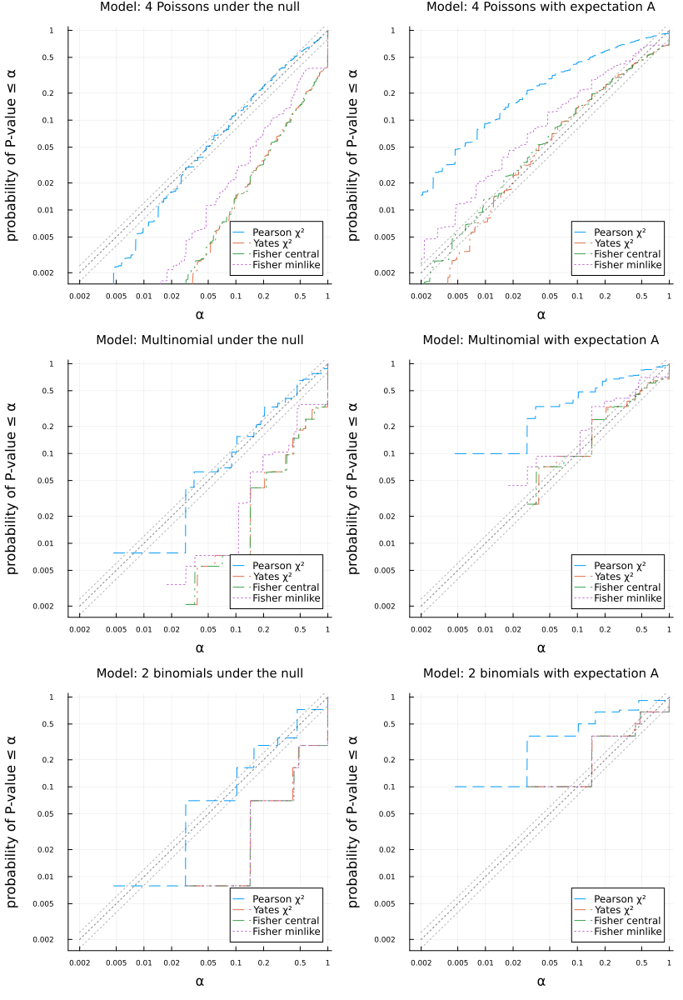

In [11]:
plot_2x2([3 1; 1 3])

A =
2×2 Matrix{Int64}:
 6  2
 2  7

pvalue_pearson_chisq_2x2(A) = 0.029549015619382227
pvalue_yates_chisq_2x2(A) = 0.09115659051595472
pvalue_fisher_central_2x2(A) = 0.08893459481694778
pvalue_fisher_minlike_2x2(A) = 0.05668449197860966

E = expectval(A) =
2×2 Matrix{Float64}:
 3.76471  4.23529
 4.23529  4.76471

N = sum(A) = 17
Ns = sum(A; dims = 2) = [8; 9;;]

-------------------- Model: 4 Poissons under the null
ECDF(pval_pearson_chisq, 0.05) = 0.055373
ECDF(pval_yates_chisq, 0.05) = 0.012627
ECDF(pval_fisher_central, 0.05) = 0.014558
ECDF(pval_fisher_minlike, 0.05) = 0.024179

ECDF(pval_pearson_chisq, 0.01) = 0.00954
ECDF(pval_yates_chisq, 0.01) = 0.001381
ECDF(pval_fisher_central, 0.01) = 0.001978
ECDF(pval_fisher_minlike, 0.01) = 0.003349

-------------------- Model: 4 Poissons with expectation A
ECDF(pval_pearson_chisq, 0.05) = 0.607622
ECDF(pval_yates_chisq, 0.05) = 0.377027
ECDF(pval_fisher_central, 0.05) = 0.392008
ECDF(pval_fisher_minlike, 0.05) = 0.465837

ECDF(pval_pearson

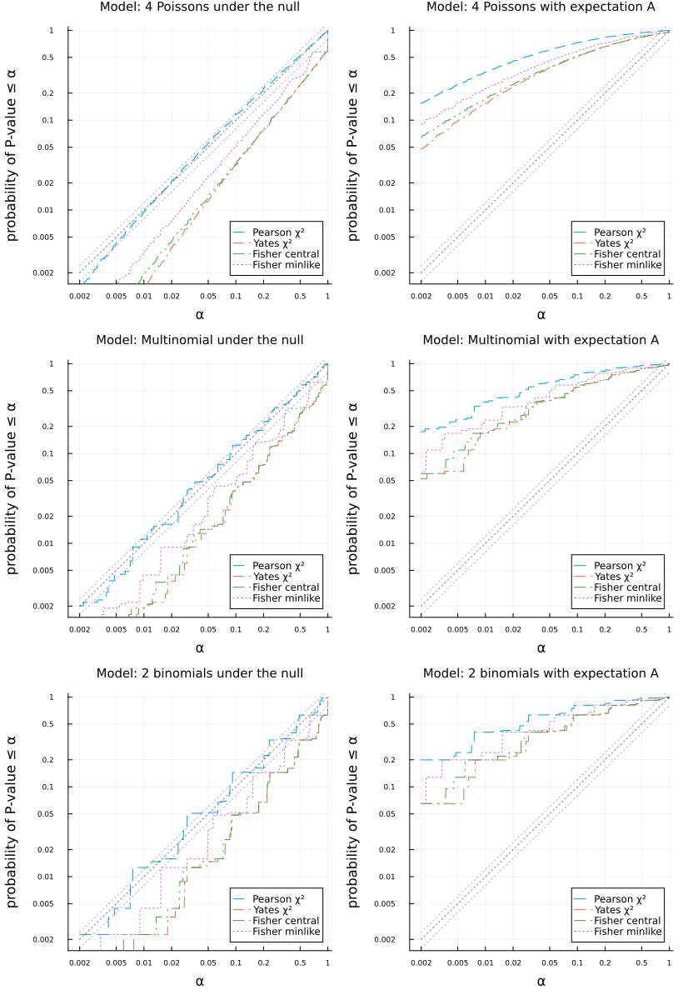

In [12]:
plot_2x2([6 2; 2 7])

A =
2×2 Matrix{Int64}:
 9  2
 2  7

pvalue_pearson_chisq_2x2(A) = 0.007693972527542988
pvalue_yates_chisq_2x2(A) = 0.026864471961340213
pvalue_fisher_central_2x2(A) = 0.02476780185758509
pvalue_fisher_minlike_2x2(A) = 0.021552750654917817

E = expectval(A) =
2×2 Matrix{Float64}:
 6.05  4.95
 4.95  4.05

N = sum(A) = 20
Ns = sum(A; dims = 2) = [11; 9;;]

-------------------- Model: 4 Poissons under the null
ECDF(pval_pearson_chisq, 0.05) = 0.05575
ECDF(pval_yates_chisq, 0.05) = 0.014702
ECDF(pval_fisher_central, 0.05) = 0.016823
ECDF(pval_fisher_minlike, 0.05) = 0.026221

ECDF(pval_pearson_chisq, 0.01) = 0.00978
ECDF(pval_yates_chisq, 0.01) = 0.001689
ECDF(pval_fisher_central, 0.01) = 0.00242
ECDF(pval_fisher_minlike, 0.01) = 0.003994

-------------------- Model: 4 Poissons with expectation A
ECDF(pval_pearson_chisq, 0.05) = 0.790595
ECDF(pval_yates_chisq, 0.05) = 0.604721
ECDF(pval_fisher_central, 0.05) = 0.616213
ECDF(pval_fisher_minlike, 0.05) = 0.682501

ECDF(pval_pearson_chisq, 0.0

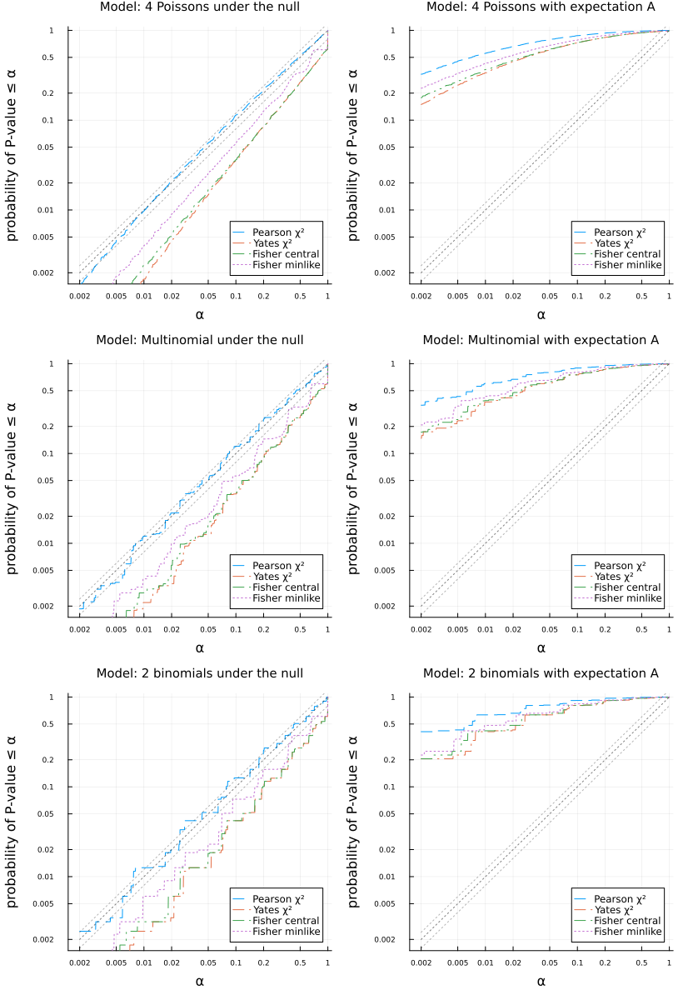

In [13]:
plot_2x2([9 2; 2 7])

A =
2×2 Matrix{Int64}:
 19  9
  4  9

pvalue_pearson_chisq_2x2(A) = 0.025962830108457294
pvalue_yates_chisq_2x2(A) = 0.05894161742818381
pvalue_fisher_central_2x2(A) = 0.05862772889821924
pvalue_fisher_minlike_2x2(A) = 0.042500493113640535

E = expectval(A) =
2×2 Matrix{Float64}:
 15.7073   12.2927
  7.29268   5.70732

N = sum(A) = 41
Ns = sum(A; dims = 2) = [28; 13;;]

-------------------- Model: 4 Poissons under the null
ECDF(pval_pearson_chisq, 0.05) = 0.051997
ECDF(pval_yates_chisq, 0.05) = 0.020962
ECDF(pval_fisher_central, 0.05) = 0.022213
ECDF(pval_fisher_minlike, 0.05) = 0.032065

ECDF(pval_pearson_chisq, 0.01) = 0.009652
ECDF(pval_yates_chisq, 0.01) = 0.003053
ECDF(pval_fisher_central, 0.01) = 0.003693
ECDF(pval_fisher_minlike, 0.01) = 0.005681

-------------------- Model: 4 Poissons with expectation A
ECDF(pval_pearson_chisq, 0.05) = 0.613003
ECDF(pval_yates_chisq, 0.05) = 0.471669
ECDF(pval_fisher_central, 0.05) = 0.472839
ECDF(pval_fisher_minlike, 0.05) = 0.531078

ECDF(pva

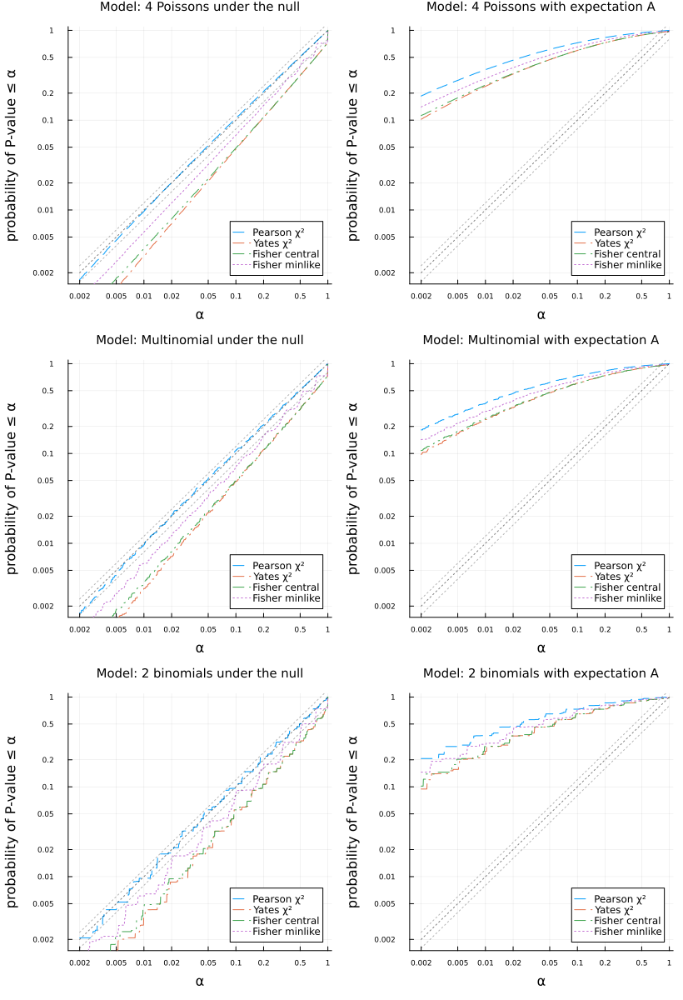

In [14]:
plot_2x2([19 9; 4 9])

In [15]:
function pearson_chisq_stat(A)
    E = expectval(A)
    sum(safediv((a - e)^2, e) for (a, e) in zip(A, E))
end

function pvalue_pearson_chisq(A)
    r, c = size(A)
    df = (r-1)*(c-1)
    chi2 = pearson_chisq_stat(A)
    ccdf(Chisq(df), chi2)
end

function sim_pearson_chisq_test(randfunc, param; L=10^6)
    pval = zeros(L)
    for i in 1:L
        A = randfunc(param)
        pval[i] = pvalue_pearson_chisq(A)
    end
    pval
end

function plot_pearson_chisq(A; L=10^6)
    println("A =")
    show(stdout, MIME("text/plain"), A)
    println()
    println()
    
    @show pvalue_pearson_chisq(A)
    println()

    E = expectval(A)
    println("E = expectval(A) =")
    show(stdout, MIME("text/plain"), E)
    println()
    println()
    @show N = sum(A)
    @show Ns = sum(A; dims=2)
    println()
    
    randfuncs = (
        randpoissons, randpoissons,
        randmultinomial, randmultinomial,
        randmultinomials, randmultinomials,
    )
    params = (
        E, A,
        (N, E / N), (N, A / N),
        (Ns, E ./ Ns), (Ns, A ./ Ns),
    )
    names = (
        "Poissons under the null", "Poissons with expectation A", 
        "Multinomial under the null", "Multinomial with expectation A", 
        "Multinomials under the null", "Multinomials with expectation A", 
    )

    PP = []
    for (randfunc, param, name) in zip(randfuncs, params, names)
        pval = sim_pearson_chisq_test(randfunc, param; L)
        println("-"^20, " ", "Model: $name")
        @show ECDF(pval, 0.05)
        @show ECDF(pval, 0.01)
        P = plot_ecdfpval([pval]; linestyles=[:solid])
        title!("Model: $name")
        push!(PP, P)
    end
    println()
    
    plot(PP...; size=(820, 1200), layout=(3, 2))
    plot!(titlefontsize=10, leftmargin=6Plots.mm)
end

plot_pearson_chisq (generic function with 1 method)

A =
2×3 Matrix{Int64}:
  7  4  23
 10  8   8

pvalue_pearson_chisq(A) = 0.016573344201902547

E = expectval(A) =
2×3 Matrix{Float64}:
 9.63333  6.8  17.5667
 7.36667  5.2  13.4333

N = sum(A) = 60
Ns = sum(A; dims = 2) = [34; 26;;]

-------------------- Model: Poissons under the null
ECDF(pval, 0.05) = 0.050452
ECDF(pval, 0.01) = 0.00911
-------------------- Model: Poissons with expectation A
ECDF(pval, 0.05) = 0.741171
ECDF(pval, 0.01) = 0.504985
-------------------- Model: Multinomial under the null
ECDF(pval, 0.05) = 0.050518
ECDF(pval, 0.01) = 0.009051
-------------------- Model: Multinomial with expectation A
ECDF(pval, 0.05) = 0.745149
ECDF(pval, 0.01) = 0.508886
-------------------- Model: Multinomials under the null
ECDF(pval, 0.05) = 0.050693
ECDF(pval, 0.01) = 0.009023
-------------------- Model: Multinomials with expectation A
ECDF(pval, 0.05) = 0.75493
ECDF(pval, 0.01) = 0.517068



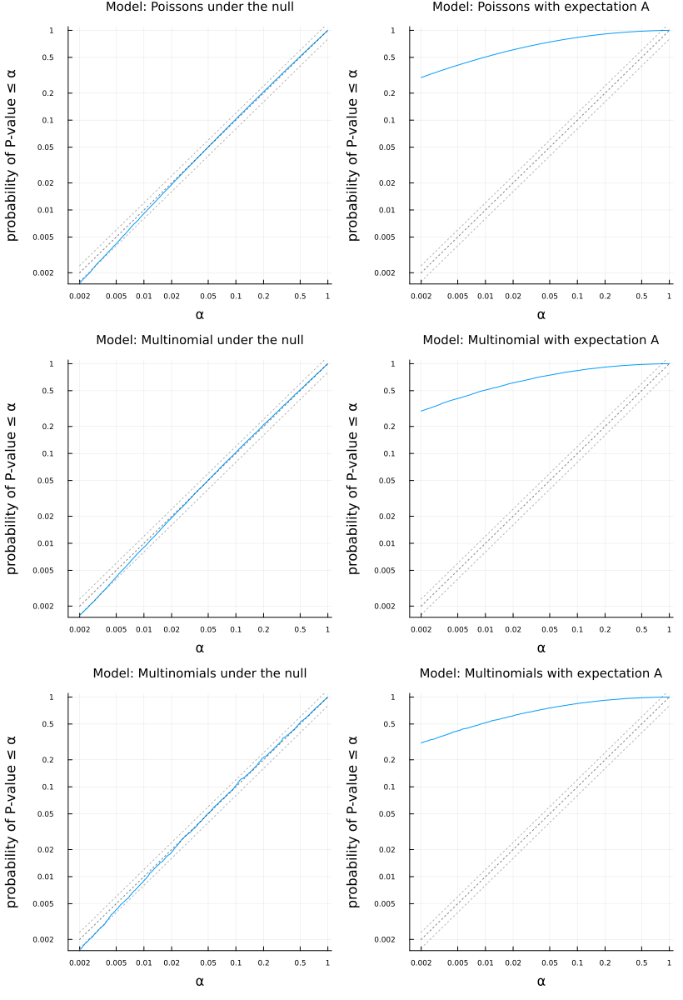

In [16]:
A = [
     7  4 23
    10  8  8
]
plot_pearson_chisq(A)

A =
2×3 Matrix{Int64}:
  7  2  23
 10  4   8

pvalue_pearson_chisq(A) = 0.032765677544625275

E = expectval(A) =
2×3 Matrix{Float64}:
 10.0741   3.55556  18.3704
  6.92593  2.44444  12.6296

N = sum(A) = 54
Ns = sum(A; dims = 2) = [32; 22;;]

-------------------- Model: Poissons under the null
ECDF(pval, 0.05) = 0.04715
ECDF(pval, 0.01) = 0.007723
-------------------- Model: Poissons with expectation A
ECDF(pval, 0.05) = 0.656076
ECDF(pval, 0.01) = 0.406109
-------------------- Model: Multinomial under the null
ECDF(pval, 0.05) = 0.047054
ECDF(pval, 0.01) = 0.007667
-------------------- Model: Multinomial with expectation A
ECDF(pval, 0.05) = 0.661498
ECDF(pval, 0.01) = 0.406535
-------------------- Model: Multinomials under the null
ECDF(pval, 0.05) = 0.04713
ECDF(pval, 0.01) = 0.007763
-------------------- Model: Multinomials with expectation A
ECDF(pval, 0.05) = 0.668038
ECDF(pval, 0.01) = 0.420267



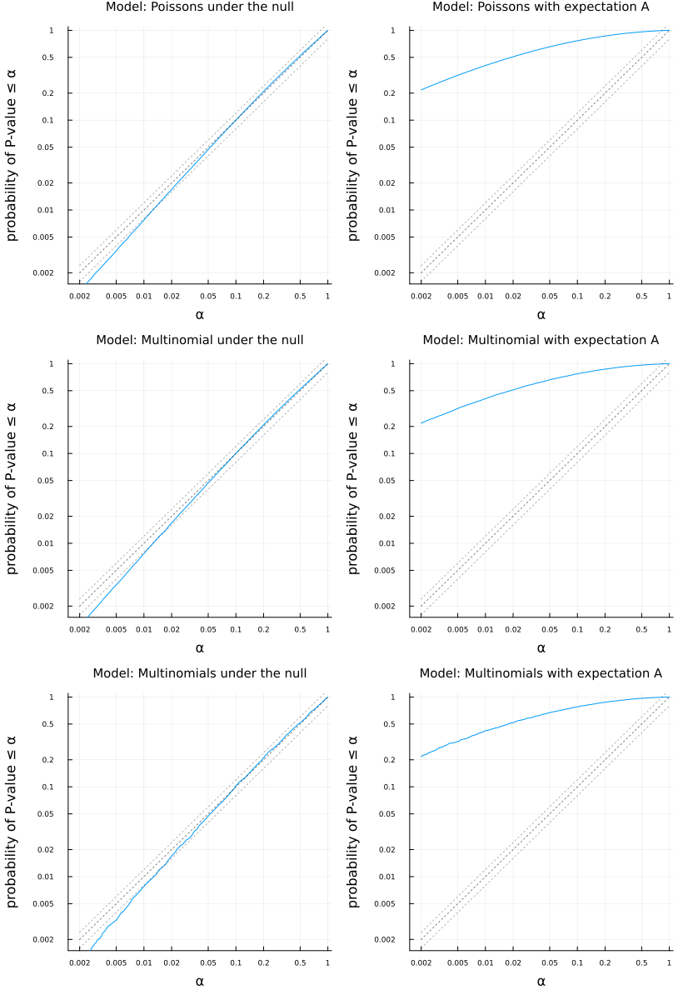

In [17]:
A = [
     7  2 23
    10  4  8
]
plot_pearson_chisq(A)

A =
2×3 Matrix{Int64}:
 7  4  23
 5  4   4

pvalue_pearson_chisq(A) = 0.06725720099757504

E = expectval(A) =
2×3 Matrix{Float64}:
 8.68085  5.78723  19.5319
 3.31915  2.21277   7.46809

N = sum(A) = 47
Ns = sum(A; dims = 2) = [34; 13;;]

-------------------- Model: Poissons under the null
ECDF(pval, 0.05) = 0.047083
ECDF(pval, 0.01) = 0.008802
-------------------- Model: Poissons with expectation A
ECDF(pval, 0.05) = 0.565686
ECDF(pval, 0.01) = 0.323532
-------------------- Model: Multinomial under the null
ECDF(pval, 0.05) = 0.047317
ECDF(pval, 0.01) = 0.008986
-------------------- Model: Multinomial with expectation A
ECDF(pval, 0.05) = 0.568309
ECDF(pval, 0.01) = 0.322262
-------------------- Model: Multinomials under the null
ECDF(pval, 0.05) = 0.047004
ECDF(pval, 0.01) = 0.008403
-------------------- Model: Multinomials with expectation A
ECDF(pval, 0.05) = 0.578398
ECDF(pval, 0.01) = 0.323458



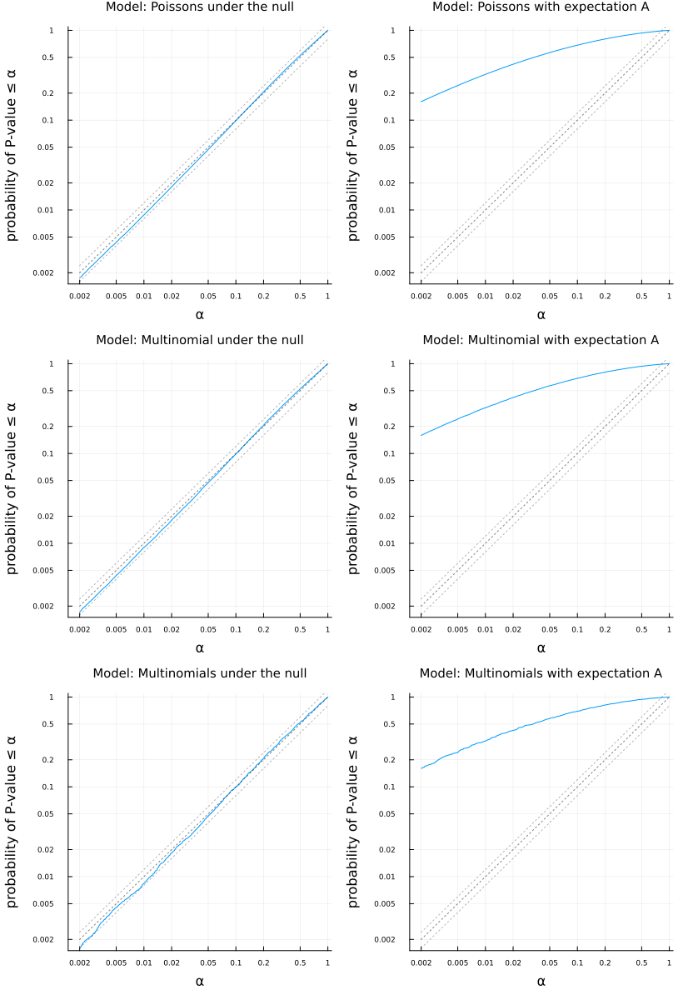

In [18]:
A = [
     7  4 23
     5  4  4
]
plot_pearson_chisq(A)